In [4]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV 
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn import  metrics
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.preprocessing import PolynomialFeatures
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn import  metrics
import matplotlib.pyplot as plt
import seaborn as sns 

In [5]:
data = pd.read_csv('Cancer_Data.csv', sep =',')
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [6]:
print(data.isnull().sum())

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             1
concave points_mean        1
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              1
perimeter_worst            1
area_worst                 0
smoothness_worst           0
compactness_worst          1
concavity_worst            0
concave points_worst       1
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64


In [7]:
data = data.dropna()

In [8]:
print(data.isnull().sum())

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 563 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       563 non-null    int64  
 1   diagnosis                563 non-null    object 
 2   radius_mean              563 non-null    float64
 3   texture_mean             563 non-null    float64
 4   perimeter_mean           563 non-null    float64
 5   area_mean                563 non-null    float64
 6   smoothness_mean          563 non-null    float64
 7   compactness_mean         563 non-null    float64
 8   concavity_mean           563 non-null    float64
 9   concave points_mean      563 non-null    float64
 10  symmetry_mean            563 non-null    float64
 11  fractal_dimension_mean   563 non-null    float64
 12  radius_se                563 non-null    float64
 13  texture_se               563 non-null    float64
 14  perimeter_se             5

In [10]:
data['diagnosis'].unique()

array(['M', 'B'], dtype=object)

In [11]:
def diagno(diagnosis):
    if diagnosis == 'M':
        return 1
    else:
        return 0

In [12]:
data['diagnosis'] = data.apply(lambda x: diagno(x['diagnosis']), axis=1)

In [13]:
data['diagnosis']

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 563, dtype: int64

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 563 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       563 non-null    int64  
 1   diagnosis                563 non-null    int64  
 2   radius_mean              563 non-null    float64
 3   texture_mean             563 non-null    float64
 4   perimeter_mean           563 non-null    float64
 5   area_mean                563 non-null    float64
 6   smoothness_mean          563 non-null    float64
 7   compactness_mean         563 non-null    float64
 8   concavity_mean           563 non-null    float64
 9   concave points_mean      563 non-null    float64
 10  symmetry_mean            563 non-null    float64
 11  fractal_dimension_mean   563 non-null    float64
 12  radius_se                563 non-null    float64
 13  texture_se               563 non-null    float64
 14  perimeter_se             5

In [15]:
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [16]:
data = data.drop('id',axis=1)
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [17]:
sns.pairplot(data)
plt.show()

In [18]:
y = data['diagnosis']
X = data.drop(['diagnosis'],axis=1)

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

In [20]:
kfold = StratifiedKFold(n_splits=5, random_state=123, shuffle=True)

In [21]:
pipe1 = Pipeline([
    ('preprocessing', StandardScaler()), 
    ('classifier', LogisticRegression(C=1, solver='newton-cg'))])

param_grid1 = {'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100]}

grid1 = GridSearchCV(pipe1, param_grid1, cv=kfold, return_train_score=True)

grid1.fit(X_train, y_train)
grid1.best_params_

{'classifier__C': 0.1}

In [22]:
pipe2 = Pipeline([('preprocessing', StandardScaler()),
                   ('classifier', SVC(kernel='linear'))])

param_grid2 = {'classifier__C': [0.001, 0.01, 0.1, 1],
              'classifier__gamma': [0.001, 0.01, 0.1, 1]}

grid2 = GridSearchCV(pipe2, param_grid2, cv=kfold, return_train_score=True)

grid2.fit(X_train, y_train)
grid2.best_params_

{'classifier__C': 0.1, 'classifier__gamma': 0.001}

In [23]:
pipe3 = Pipeline([('preprocessing', StandardScaler()),
                   ('classifier', SVC(kernel='rbf'))])

param_grid3 = {'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100],
              'classifier__gamma': [0.001, 0.01, 0.1, 1, 10, 100]}

grid3 = GridSearchCV(pipe3, param_grid3, cv=kfold, return_train_score=True)

grid3.fit(X_train, y_train)
grid3.best_params_

{'classifier__C': 10, 'classifier__gamma': 0.01}

In [24]:
pipe4 = Pipeline([('preprocessing', StandardScaler()), 
                   ('classifier', RandomForestClassifier(n_estimators=500, max_leaf_nodes=16))])

param_grid4 = {'classifier__n_estimators': [5, 10, 50, 100],
              'classifier__max_leaf_nodes': [5, 10, 20],
              'classifier__max_depth': [5, 10, 20]}

grid4 = GridSearchCV(pipe4, param_grid4, cv=kfold, return_train_score=True)

grid4.fit(X_train, y_train)
grid4.best_params_

{'classifier__max_depth': 20,
 'classifier__max_leaf_nodes': 20,
 'classifier__n_estimators': 100}

In [25]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
pipe5 = Pipeline([('preprocessing', StandardScaler()), 
                   ('classifier', AdaBoostClassifier(
                       DecisionTreeClassifier(random_state=42),
                       n_estimators=500,
                       learning_rate=0.5))])

param_grid5 = {'classifier__n_estimators': [10,50,100],
              'classifier__learning_rate': [0.1, 0.2, 0.3,0.5,0.6,0.7,0.8,0.9]}

grid5 = GridSearchCV(pipe5, param_grid5, cv=kfold, return_train_score=True)

grid5.fit(X_train, y_train)
grid5.best_params_

{'classifier__learning_rate': 0.1, 'classifier__n_estimators': 10}

In [26]:
pipe6 = Pipeline([('preprocessing', StandardScaler()), ('classifier', 
                                                         DecisionTreeClassifier(random_state=0))])
param_grid6 = {'preprocessing': [MinMaxScaler(), StandardScaler(), None],
    'classifier__max_depth': [1, 2, 5, 10, 100],
    'classifier__min_samples_leaf': [1, 2, 4, 10]}

grid6 = GridSearchCV(pipe6, param_grid6, cv=kfold, return_train_score=True)

grid6.fit(X_train, y_train)
grid6.best_params_

{'classifier__max_depth': 10,
 'classifier__min_samples_leaf': 2,
 'preprocessing': MinMaxScaler()}

In [27]:
models = []
models.append(('LR', grid1.best_estimator_))
models.append(('SVC linear', grid2.best_estimator_))
models.append(('SVC rbf', grid3.best_estimator_))
models.append(('RandomForest', grid4.best_estimator_))
models.append(('AdaBoost', grid5.best_estimator_))
models.append(('DecisionTree', grid6.best_estimator_))

precision_score = []
recall_score = []
f1_score = []
accuracy_score = []
for name, model in models:
  print(name)
  print("precision_score: {}".format(metrics.precision_score(y_test, model.predict(X_test), average='micro')))
  print("recall_score: {}".format(metrics.recall_score(y_test, model.predict(X_test), average='micro')))
  print("f1_score: {}".format(metrics.f1_score(y_test, model.predict(X_test), average='micro')))
  print("accuracy_score: {}".format(metrics.accuracy_score(y_test, model.predict(X_test))))
  precision_score.append(metrics.precision_score(y_test, model.predict(X_test), average='micro'))
  recall_score.append(metrics.recall_score(y_test, model.predict(X_test), average='micro'))
  f1_score.append(metrics.f1_score(y_test, model.predict(X_test), average='micro'))
  accuracy_score.append(metrics.accuracy_score(y_test, model.predict(X_test)))

d = {'precision_score': precision_score, 
     'recall_score': recall_score, 
     'f1_score': f1_score,
     'accuracy_score' : accuracy_score
    }
df = pd.DataFrame(data=d)
df.insert(loc=0, column='Method', value=['LR','SVC linear','SVC rbf',"RandomForest","AdaBoost","DecisionTree"])
df

LR
precision_score: 0.9822485207100592
recall_score: 0.9822485207100592
f1_score: 0.9822485207100592
accuracy_score: 0.9822485207100592
SVC linear
precision_score: 0.9822485207100592
recall_score: 0.9822485207100592
f1_score: 0.9822485207100592
accuracy_score: 0.9822485207100592
SVC rbf
precision_score: 0.9881656804733728
recall_score: 0.9881656804733728
f1_score: 0.9881656804733728
accuracy_score: 0.9881656804733728
RandomForest
precision_score: 0.9704142011834319
recall_score: 0.9704142011834319
f1_score: 0.9704142011834319
accuracy_score: 0.9704142011834319
AdaBoost
precision_score: 0.9467455621301775
recall_score: 0.9467455621301775
f1_score: 0.9467455621301775
accuracy_score: 0.9467455621301775
DecisionTree
precision_score: 0.9526627218934911
recall_score: 0.9526627218934911
f1_score: 0.9526627218934911
accuracy_score: 0.9526627218934911


,Method,precision_score,recall_score,f1_score,accuracy_score
0,LR,0.982249,0.982249,0.982249,0.982249
1,SVC linear,0.982249,0.982249,0.982249,0.982249
2,SVC rbf,0.988166,0.988166,0.988166,0.988166
3,RandomForest,0.970414,0.970414,0.970414,0.970414
4,AdaBoost,0.946746,0.946746,0.946746,0.946746
5,DecisionTree,0.952663,0.952663,0.952663,0.952663


In [28]:
# Sieci neuronowe
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.backend import clear_session
from keras.callbacks import EarlyStopping
from keras.callbacks import History
from tensorflow.python.keras.layers import Dropout

In [29]:
history = History()
model = Sequential()
model.add(Dense(100,activation="sigmoid", input_shape=(X_train.shape[1],)))
model.add(Dense(50,activation="sigmoid"))
model.add(Dense(10,activation="sigmoid"))
model.add(Dense(1,activation="sigmoid"))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 100)               3100      
                                                                 
 dense_1 (Dense)             (None, 50)                5050      
                                                                 
 dense_2 (Dense)             (None, 10)                510       
                                                                 
 dense_3 (Dense)             (None, 1)                 11        
                                                                 
Total params: 8,671
Trainable params: 8,671
Non-trainable params: 0
_________________________________________________________________


In [38]:
model.compile(loss="binary_crossentropy", optimizer="Adam", metrics=["accuracy"])

In [39]:
history = model.fit(X_train, y_train, validation_data= (X_test, y_test), batch_size=32, epochs=100)

Epoch 1/100
13/13 [==============================] - 1s 13ms/step - loss: 0.0900 - accuracy: 0.9645 - val_loss: 0.1172 - val_accuracy: 0.9527
Epoch 2/100
13/13 [==============================] - 0s 3ms/step - loss: 0.1021 - accuracy: 0.9645 - val_loss: 0.2044 - val_accuracy: 0.9349
Epoch 3/100
13/13 [==============================] - 0s 3ms/step - loss: 0.1282 - accuracy: 0.9619 - val_loss: 0.1697 - val_accuracy: 0.9527
Epoch 4/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0941 - accuracy: 0.9619 - val_loss: 0.1196 - val_accuracy: 0.9586
Epoch 5/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0865 - accuracy: 0.9619 - val_loss: 0.1415 - val_accuracy: 0.9527
Epoch 6/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0775 - accuracy: 0.9645 - val_loss: 0.1220 - val_accuracy: 0.9586
Epoch 7/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0754 - accuracy: 0.9670 - val_loss: 0.1332 - val_accuracy: 0.9527
Epoch 8/100


Epoch 59/100
13/13 [==============================] - 0s 4ms/step - loss: 0.0753 - accuracy: 0.9619 - val_loss: 0.1187 - val_accuracy: 0.9527
Epoch 60/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0586 - accuracy: 0.9721 - val_loss: 0.1335 - val_accuracy: 0.9527
Epoch 61/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0944 - accuracy: 0.9594 - val_loss: 0.1118 - val_accuracy: 0.9527
Epoch 62/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0912 - accuracy: 0.9569 - val_loss: 0.1168 - val_accuracy: 0.9586
Epoch 63/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0874 - accuracy: 0.9594 - val_loss: 0.1201 - val_accuracy: 0.9645
Epoch 64/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0746 - accuracy: 0.9721 - val_loss: 0.1005 - val_accuracy: 0.9586
Epoch 65/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0697 - accuracy: 0.9695 - val_loss: 0.1651 - val_accuracy: 0.9349
Epoch 

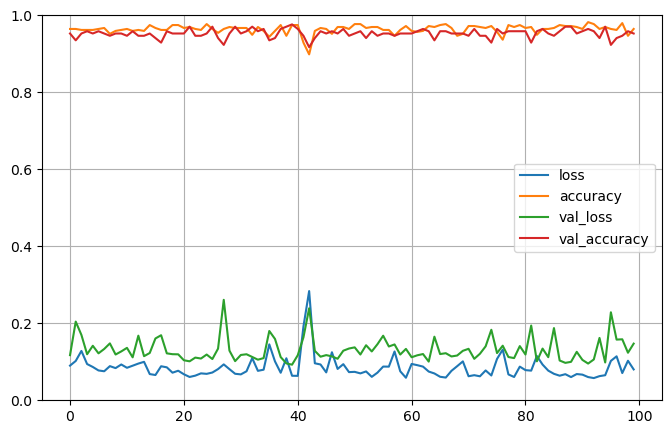

In [40]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

In [41]:
model.evaluate(X_test,y_test)

6/6 [==============================] - 0s 1ms/step - loss: 0.1471 - accuracy: 0.9527


[0.14714612066745758, 0.9526627063751221]

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 100)               3100      
                                                                 
 dense_1 (Dense)             (None, 50)                5050      
                                                                 
 dense_2 (Dense)             (None, 10)                510       
                                                                 
 dense_3 (Dense)             (None, 1)                 11        
                                                                 
Total params: 8,671
Trainable params: 8,671
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0845 - accuracy: 0.9670 - val_loss: 0.1167 - val_accuracy: 0.9527
Epoch 2/100
13/13 [==========================

13/13 [==============================] - 0s 3ms/step - loss: 0.1012 - accuracy: 0.9619 - val_loss: 0.1171 - val_accuracy: 0.9645
Epoch 53/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0678 - accuracy: 0.9645 - val_loss: 0.1277 - val_accuracy: 0.9408
Epoch 54/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0711 - accuracy: 0.9772 - val_loss: 0.1302 - val_accuracy: 0.9527
Epoch 55/100
13/13 [==============================] - 0s 3ms/step - loss: 0.1039 - accuracy: 0.9594 - val_loss: 0.1139 - val_accuracy: 0.9645
Epoch 56/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0995 - accuracy: 0.9594 - val_loss: 0.1147 - val_accuracy: 0.9527
Epoch 57/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0709 - accuracy: 0.9695 - val_loss: 0.1266 - val_accuracy: 0.9527
Epoch 58/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0813 - accuracy: 0.9721 - val_loss: 0.1235 - val_accuracy: 0.9527
Epoch 59/100
13/13 

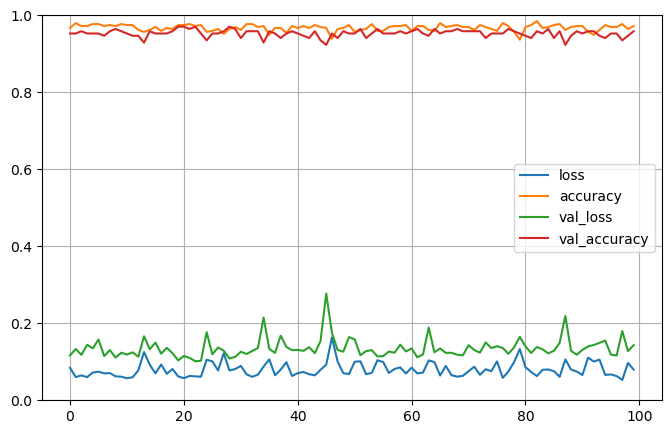

6/6 [==============================] - 0s 1ms/step - loss: 0.3728 - accuracy: 0.6272


[0.37278106808662415, 0.6272189617156982]

In [63]:
clear_session()
model2 = Sequential()
model2.add(Dense(100,activation="relu", input_shape=(X_train.shape[1],)))
model2.add(Dense(50,activation="relu"))
model2.add(Dense(10,activation="relu"))
model2.add(Dense(1,activation="sigmoid"))
model2.summary()

model2.compile(loss="mean_squared_error", optimizer="Adam", metrics=["accuracy"])

history2 = model.fit(X_train, y_train, validation_data= (X_test, y_test), batch_size=32, epochs=100)

pd.DataFrame(history2.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

model2.evaluate(X_test,y_test)

In [43]:
clear_session()
model3 = Sequential()
model3.add(Dense(100,activation="elu", input_shape=(X_train.shape[1],)))
model3.add(Dense(50,activation="elu"))
model3.add(Dense(10,activation="elu"))
model3.add(Dense(1,activation="sigmoid"))
model3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 100)               3100      
                                                                 
 dense_1 (Dense)             (None, 50)                5050      
                                                                 
 dense_2 (Dense)             (None, 10)                510       
                                                                 
 dense_3 (Dense)             (None, 1)                 11        
                                                                 
Total params: 8,671
Trainable params: 8,671
Non-trainable params: 0
_________________________________________________________________


In [44]:
model3.compile(loss="binary_crossentropy", optimizer="Adam", metrics=["accuracy"])

history3 = model.fit(X_train, y_train, validation_data= (X_test, y_test), batch_size=32, epochs=100)

Epoch 1/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0580 - accuracy: 0.9797 - val_loss: 0.1116 - val_accuracy: 0.9645
Epoch 2/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0572 - accuracy: 0.9746 - val_loss: 0.1064 - val_accuracy: 0.9704
Epoch 3/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0663 - accuracy: 0.9721 - val_loss: 0.1036 - val_accuracy: 0.9586
Epoch 4/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0670 - accuracy: 0.9772 - val_loss: 0.1395 - val_accuracy: 0.9586
Epoch 5/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0860 - accuracy: 0.9645 - val_loss: 0.1072 - val_accuracy: 0.9586
Epoch 6/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0559 - accuracy: 0.9797 - val_loss: 0.1554 - val_accuracy: 0.9467
Epoch 7/100
13/13 [==============================] - 0s 4ms/step - loss: 0.0647 - accuracy: 0.9721 - val_loss: 0.1086 - val_accuracy: 0.9527
Epoch 8/100
1

Epoch 59/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0992 - accuracy: 0.9619 - val_loss: 0.1720 - val_accuracy: 0.9586
Epoch 60/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0911 - accuracy: 0.9569 - val_loss: 0.1381 - val_accuracy: 0.9527
Epoch 61/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0936 - accuracy: 0.9594 - val_loss: 0.1028 - val_accuracy: 0.9645
Epoch 62/100
13/13 [==============================] - 0s 4ms/step - loss: 0.0857 - accuracy: 0.9670 - val_loss: 0.1324 - val_accuracy: 0.9527
Epoch 63/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0633 - accuracy: 0.9746 - val_loss: 0.1572 - val_accuracy: 0.9645
Epoch 64/100
13/13 [==============================] - 0s 3ms/step - loss: 0.1132 - accuracy: 0.9569 - val_loss: 0.1158 - val_accuracy: 0.9645
Epoch 65/100
13/13 [==============================] - 0s 3ms/step - loss: 0.1045 - accuracy: 0.9518 - val_loss: 0.1273 - val_accuracy: 0.9467
Epoch 

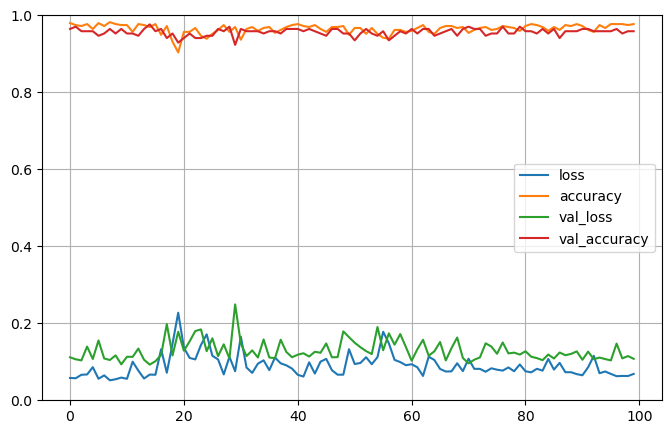

6/6 [==============================] - 0s 1ms/step - loss: 48.2263 - accuracy: 0.6272


[48.226253509521484, 0.6272189617156982]

In [45]:
pd.DataFrame(history3.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

model3.evaluate(X_test,y_test)

In [64]:
clear_session()
model4 = Sequential()
model4.add(Dense(100,activation="sigmoid",input_shape=(X_train.shape[1],)))
model4.add(Dropout(0.4))
model4.add(Dense(50,activation="sigmoid"))
model4.add(Dropout(0.4))
model4.add(Dense(25,activation="sigmoid"))
model4.add(Dropout(0.4))
model4.add(Dense(15,activation="sigmoid"))
model4.add(Dropout(0.4))
model4.add(Dense(10,activation="sigmoid"))
model4.add(Dropout(0.4))
model4.add(Dense(1,activation="sigmoid"))
model4.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 100)               3100      
                                                                 
 module_wrapper (ModuleWrapp  (None, 100)              0         
 er)                                                             
                                                                 
 dense_1 (Dense)             (None, 50)                5050      
                                                                 
 module_wrapper_1 (ModuleWra  (None, 50)               0         
 pper)                                                           
                                                                 
 dense_2 (Dense)             (None, 25)                1275      
                                                                 
 module_wrapper_2 (ModuleWra  (None, 25)               0

In [65]:
model4.compile(loss="mean_squared_error", optimizer="Adam", metrics=["accuracy"])

history4 = model.fit(X_train, y_train, validation_data= (X_test, y_test), batch_size=32, epochs=100)

Epoch 1/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0858 - accuracy: 0.9645 - val_loss: 0.1150 - val_accuracy: 0.9586
Epoch 2/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0938 - accuracy: 0.9619 - val_loss: 0.1208 - val_accuracy: 0.9586
Epoch 3/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0663 - accuracy: 0.9721 - val_loss: 0.1183 - val_accuracy: 0.9645
Epoch 4/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0651 - accuracy: 0.9746 - val_loss: 0.1192 - val_accuracy: 0.9586
Epoch 5/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0650 - accuracy: 0.9695 - val_loss: 0.1417 - val_accuracy: 0.9467
Epoch 6/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0601 - accuracy: 0.9797 - val_loss: 0.1561 - val_accuracy: 0.9408
Epoch 7/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0921 - accuracy: 0.9670 - val_loss: 0.2122 - val_accuracy: 0.9349
Epoch 8/100
1

Epoch 59/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0599 - accuracy: 0.9721 - val_loss: 0.1187 - val_accuracy: 0.9467
Epoch 60/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0587 - accuracy: 0.9746 - val_loss: 0.1442 - val_accuracy: 0.9408
Epoch 61/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0992 - accuracy: 0.9645 - val_loss: 0.1723 - val_accuracy: 0.9408
Epoch 62/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0941 - accuracy: 0.9569 - val_loss: 0.1259 - val_accuracy: 0.9527
Epoch 63/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0594 - accuracy: 0.9746 - val_loss: 0.1216 - val_accuracy: 0.9527
Epoch 64/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0551 - accuracy: 0.9772 - val_loss: 0.1238 - val_accuracy: 0.9645
Epoch 65/100
13/13 [==============================] - 0s 3ms/step - loss: 0.0593 - accuracy: 0.9670 - val_loss: 0.1292 - val_accuracy: 0.9408
Epoch 

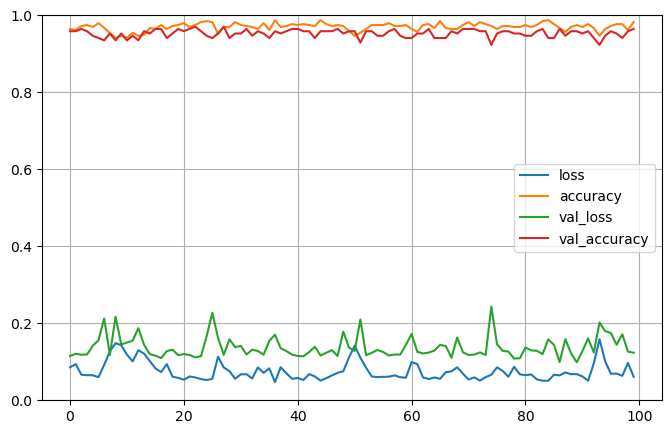

6/6 [==============================] - 0s 1ms/step - loss: 0.3031 - accuracy: 0.3728


[0.30313000082969666, 0.37278106808662415]

In [66]:
pd.DataFrame(history4.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

model4.evaluate(X_test,y_test)

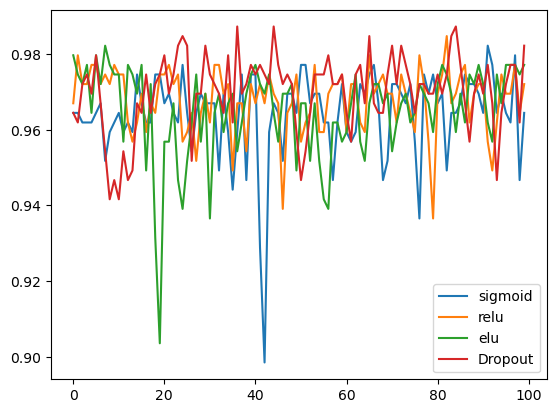

In [67]:
plt.plot(history.history['accuracy'], label = "sigmoid")

plt.plot(history2.history['accuracy'], label = "relu")

plt.plot(history3.history['accuracy'], label = "elu")

plt.plot(history4.history['accuracy'], label = "Dropout")

plt.legend()
plt.show()

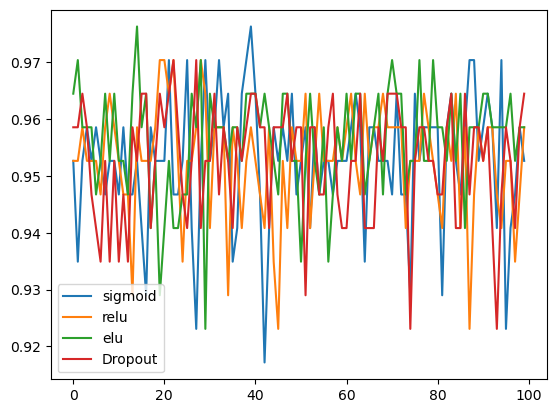

In [68]:
plt.plot(history.history['val_accuracy'], label = "sigmoid")
plt.plot(history2.history['val_accuracy'], label = "relu")
plt.plot(history3.history['val_accuracy'], label = "elu")
plt.plot(history4.history['val_accuracy'], label = "Dropout")

plt.legend()
plt.show()